# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

import time
from tqdm.notebook import tqdm
import requests

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = '../../data/DE/ANOVA_mean/'

In [3]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [4]:
os.listdir(de_dir_path)

['anova_mamm_mean.csv',
 'cluster_spectr_anova_mean_6.csv',
 'cluster_spectr_anova_mean_7.csv',
 'cluster_spectr_anova_mean_8.csv',
 'cluster_spectr_anova_mean_9.csv',
 'ttest_mamm_mean.csv']

## Load files

### DE results

In [5]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_mean.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,0.122578,12.0,2.796490,0.003701,0.010364
AAAS,0.017527,12.0,0.944161,0.509517,0.596369
AACS,0.136394,12.0,2.729393,0.004508,0.012212
AADAT,0.057031,12.0,5.478881,0.000002,0.000016
AAGAB,0.043359,12.0,2.127609,0.026045,0.053640


In [6]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels
anova_labels.name = 'ANOVA_labels'

## Load normalized pseudobulks

In [7]:
pb_dir_path = '../../data/pseudobulks/'

In [8]:
os.listdir(pb_dir_path)

['4spe_pb_mean_filt.h5ad',
 '4spe_pb_mean_filt_nor_mean.h5ad',
 'pb_age.h5ad',
 'pb_mammals.h5ad',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'pb_mammals_samplenorm_zscore.h5ad']

In [9]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_mean.h5ad')
#adata_pb_norm_mean.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

In [10]:
background_genes = adata_pb_norm.var_names.tolist()
len(background_genes)

9208

In [11]:
adata_pb_tup = sc.read_h5ad(pb_dir_path + '4spe_pb_mean_filt_nor_mean.h5ad')
adata_pb_tup = adata_pb_tup[adata_pb_tup.obs.condition == 'treeshrew']
adata_pb_tup

View of AnnData object with n_obs × n_vars = 26 × 6523
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    var: 'gene_name'
    uns: 'log1p'

In [12]:
adata_pb_4spe = sc.concat([adata_pb_norm.copy(), adata_pb_tup.copy()])
adata_pb_4spe

AnnData object with n_obs × n_vars = 115 × 5844
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'

In [13]:
adata_pb_4spe.write_h5ad("results/adata_4spe.h5ad")

## Specie-specific genes

In [16]:
import pickle
with open("./results/specie_specific_genes_tr50.pkl", "rb") as file:
    genes_dict77 = pickle.load(file)

In [17]:
hs_labels = pd.read_csv('results/human_clusters_50.csv', index_col=0)['0']
hs_labels

ZMYND8     0
CSPG5      0
IGFBP2     0
PLP1       0
PCSK2      0
          ..
RIT2       3
CPLX3      3
S100A10    3
NUDT4      3
MAP6       3
Name: 0, Length: 171, dtype: int64

# Clusterisation

In [18]:
adata_pb_4spe.obs_names

Index(['chimp_11454_L1', 'chimp_13309_L1', 'chimp_j8_L1', 'human_759_L1',
       'human_j12_L1', 'human_j3_L1', 'human_j4_L1', 'human_j6_L1',
       'macaque_0701_L1', 'macaque_0703_L1',
       ...
       'L2.treeshrew_s32', 'L6.treeshrew_s31', 'L6.treeshrew_s32',
       'L3.treeshrew_s32', 'L4.treeshrew_s31', 'L4.treeshrew_s32',
       'WM.treeshrew_s31', 'L1.treeshrew_s32', 'L1.treeshrew_s31',
       'WM.treeshrew_s32'],
      dtype='object', length=115)

In [19]:
df = pd.DataFrame(adata_pb_4spe.X, index=adata_pb_4spe.obs_names, columns=adata_pb_4spe.var_names)

In [20]:
hs_genes = genes_dict77['human']
hs_genes_inter = df.columns.intersection(hs_genes)
hs_genes_inter.size

115

In [21]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque', 'treeshrew']:
    samples = df.loc[df.index.str.contains(cond)].index
    if cond == 'treeshrew':
        order = sorted(samples.tolist(), key=lambda x: x[:2])
    else:
        order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque'] + sample_order['treeshrew']
df = df.loc[sample_order['all']]
#df_hs = df[hs_genes]

## Hierarchial

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


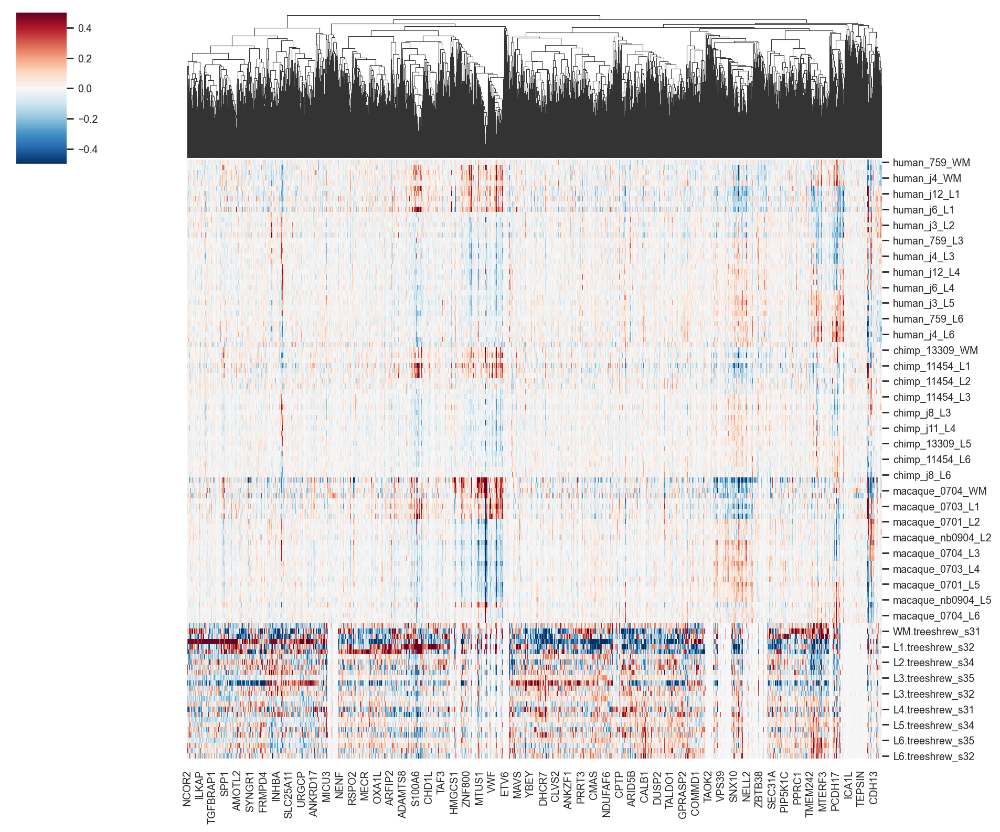

In [22]:
sns.set(font_scale=0.8)
sns.clustermap(df, figsize=(12, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

## Spectral clusterisation

In [21]:
#labels.to_csv('./results/human_clusters_77.csv')

In [24]:
hs_labels_inter = hs_labels.loc[hs_genes_inter].sort_values()
hs_labels_inter

ZMYND8     0
PCSK1      0
KCNG1      0
DOK5       0
DPYSL5     0
          ..
RALYL      3
RGMA       3
RGS4       3
S100A10    3
ALCAM      3
Name: 0, Length: 115, dtype: int64

In [34]:
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown']

In [35]:
colors = cluster_color[:n_clusters]
clusters = np.arange(n_clusters)

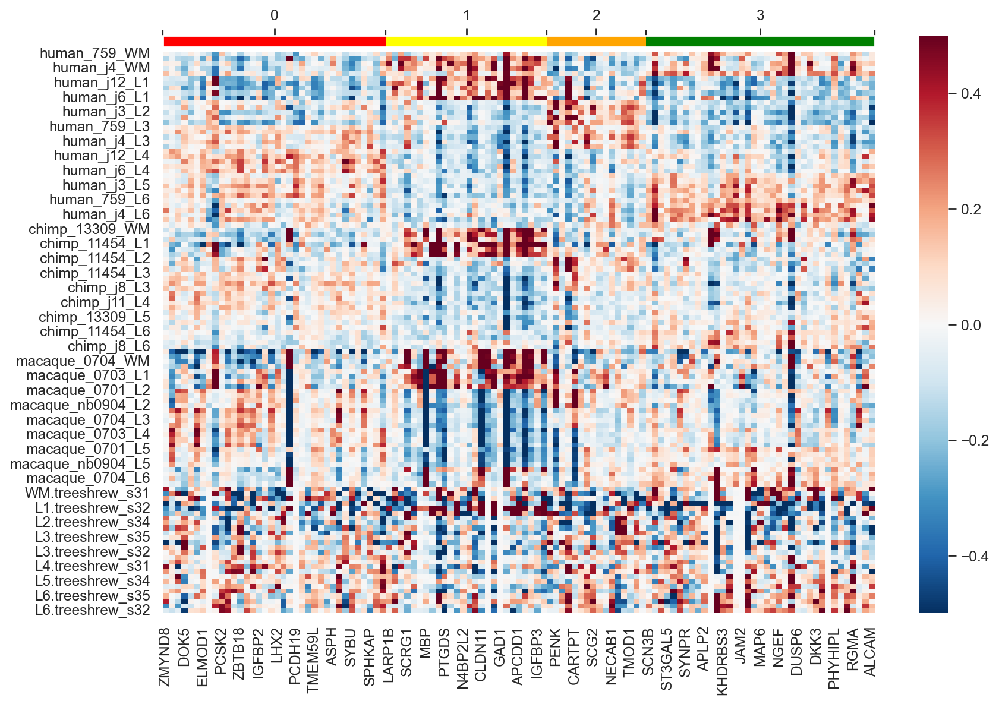

In [37]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df[hs_labels_inter.index], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = hs_labels_inter.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

<Axes: >

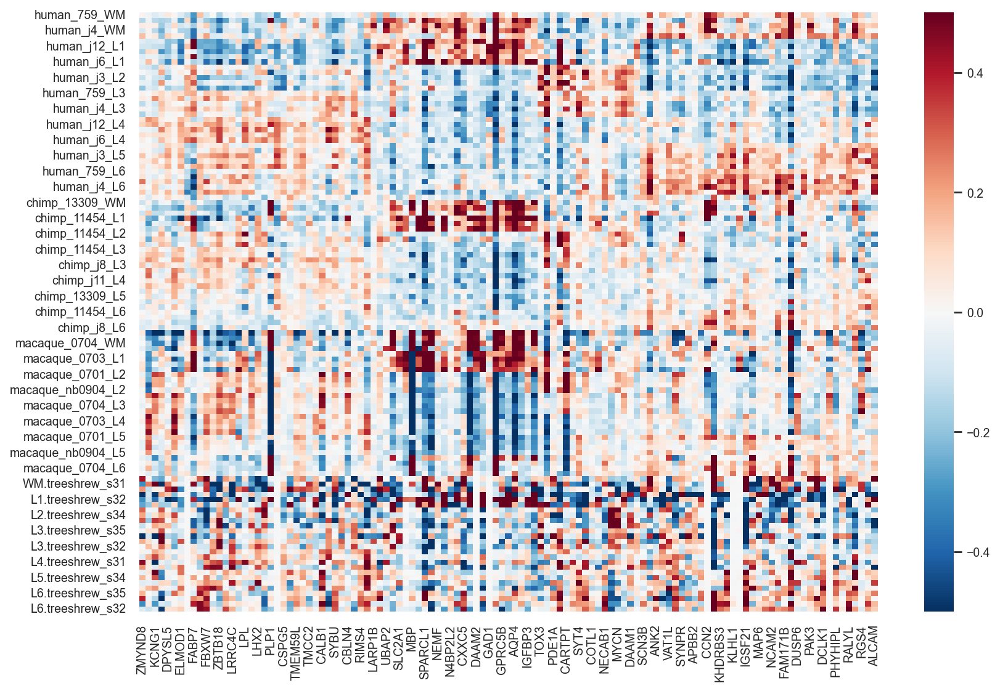

In [25]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df[hs_labels_inter.index], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

## Cluster profiles

In [14]:
df_annotation = df[hs_labels_inter.index].copy()
df_annotation['layer'] = adata_pb_4spe.obs.layer
df_annotation['condition'] = adata_pb_4spe.obs.condition

NameError: name 'df' is not defined

In [ ]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

In [28]:
n_clusters = hs_labels_inter.unique().size
n_clusters

4

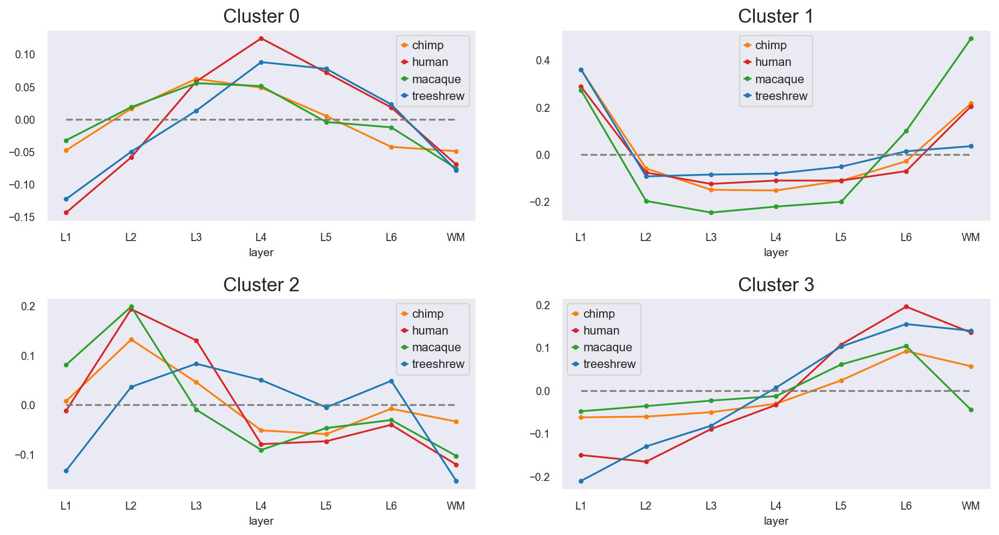

In [29]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(hs_labels_inter.unique(), axes.flatten()):
    genes = hs_labels_inter[hs_labels_inter == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

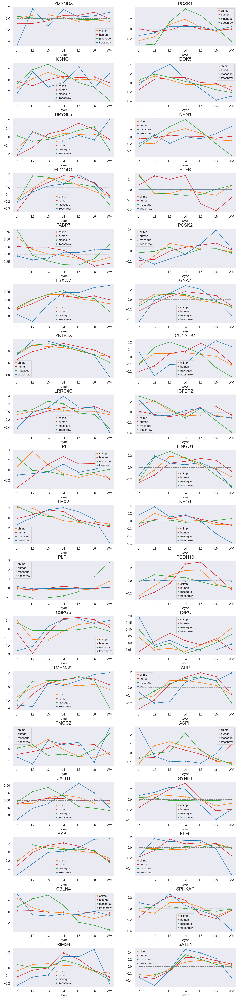

In [40]:
sns.set(font_scale=1)
label = 0
genes = hs_labels_inter[hs_labels_inter == label].index.tolist()
fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})

for gene, ax in zip(genes, axes.flatten()):
    (
        layer_mean[gene]
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'{gene}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig('figures/cluster0.pdf')

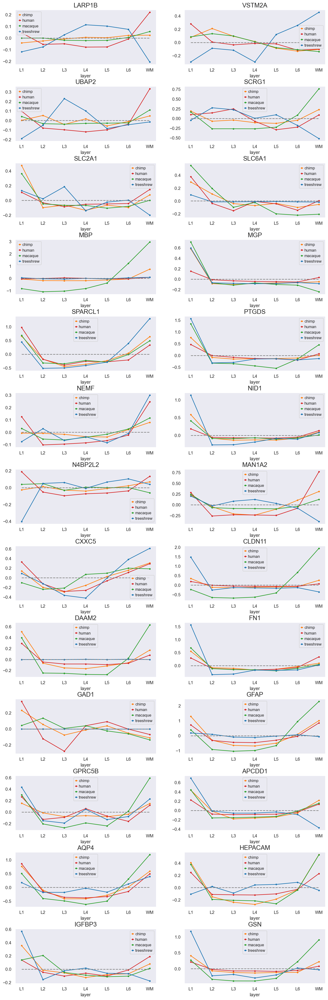

In [41]:
sns.set(font_scale=1)
label = 1
genes = hs_labels_inter[hs_labels_inter == label].index.tolist()
fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})

for gene, ax in zip(genes, axes.flatten()):
    (
        layer_mean[gene]
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'{gene}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig('figures/cluster1.pdf')

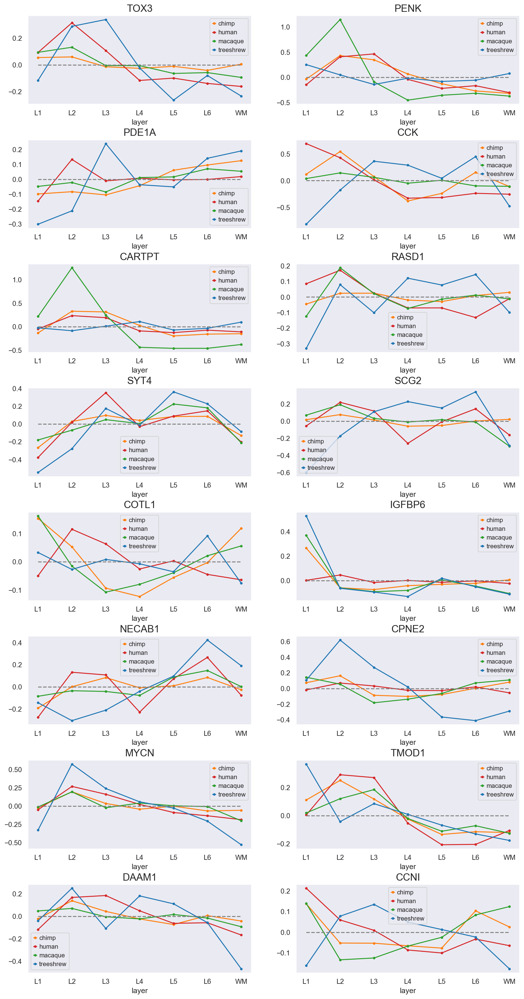

In [42]:
sns.set(font_scale=1)
label = 2
genes = hs_labels_inter[hs_labels_inter == label].index.tolist()
fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})

for gene, ax in zip(genes, axes.flatten()):
    (
        layer_mean[gene]
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'{gene}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig('figures/cluster2.pdf')

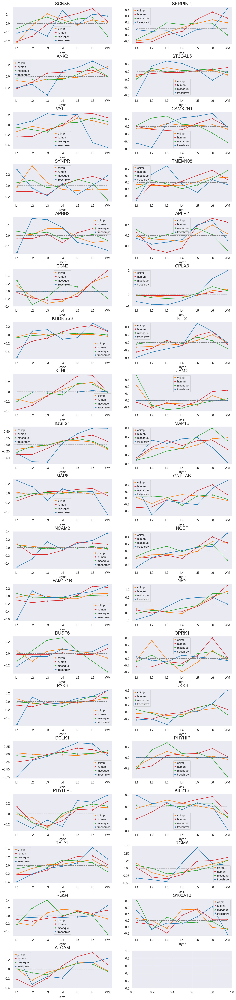

In [43]:
sns.set(font_scale=1)
label = 3
genes = hs_labels_inter[hs_labels_inter == label].index.tolist()
fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})

for gene, ax in zip(genes, axes.flatten()):
    (
        layer_mean[gene]
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'{gene}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig('figures/cluster3.pdf')

Genes

In [54]:
adata_pb = sc.read_h5ad(pb_dir_path + 'pb_mammals_filtered.h5ad')
adata_pb

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    layers: 'psbulk_props'

In [73]:
import pickle
with open("./results/l1_distances.pkl", "rb") as file:
    l1_distances = pickle.load(file)

In [74]:
hc_l1 = l1_distances['hc_l1']

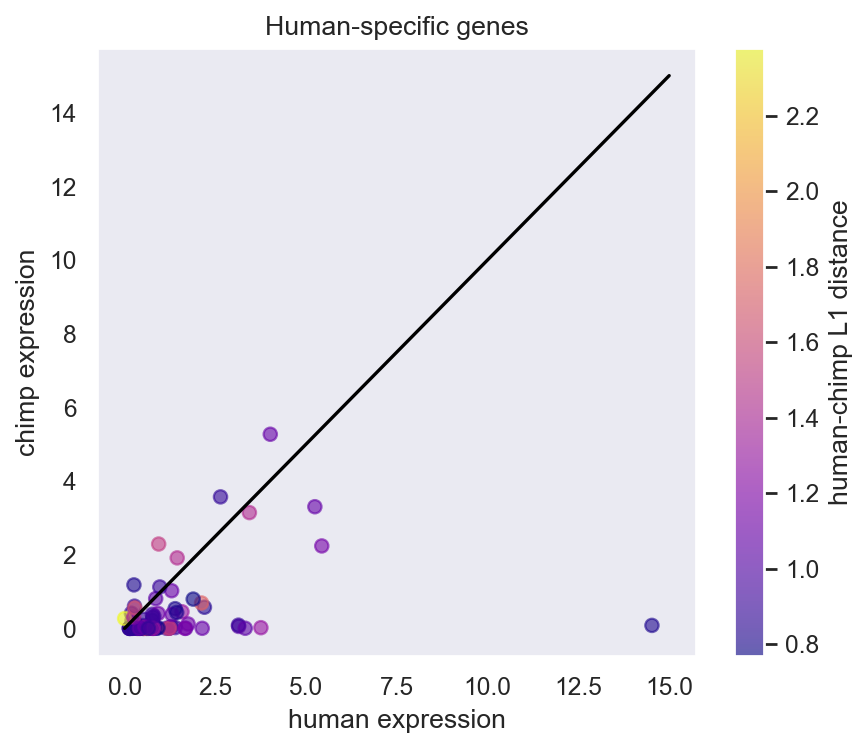

In [75]:
import matplotlib as mpl

plt.figure(figsize=(6, 5))
cmap = mpl.cm.plasma
genes = hs_labels_inter.index
human_expr = adata_pb[adata_pb.obs.condition == 'human', genes].X.mean(axis=0)
chimp_expr = adata_pb[adata_pb.obs.condition == 'chimp', genes].X.mean(axis=0)

plt.scatter(human_expr, chimp_expr, marker='o', c=hc_l1.loc[genes], alpha=0.6, cmap=cmap)
plt.plot([0, 15], [0, 15], 'black')
plt.xlabel('human expression')
plt.ylabel('chimp expression')
plt.title('Human-specific genes')
plt.grid(False)
#plt.xlim(-0.5, 20)
#plt.ylim(-0.5, 20)
plt.colorbar(label='human-chimp L1 distance')

In [76]:
adata_norm = adata_pb.copy()
sc.pp.normalize_total(adata_norm, target_sum=1e4)
sc.pp.log1p(adata_norm)

normalizing counts per cell
    finished (0:00:00)


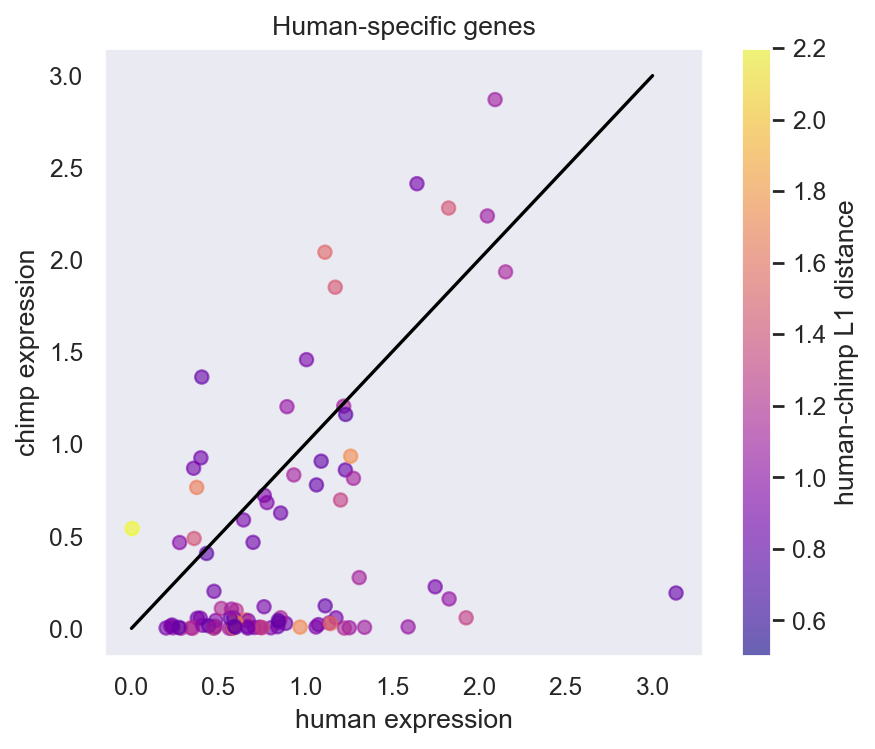

In [78]:
plt.figure(figsize=(6, 5))
cmap = mpl.cm.plasma
norm = mpl.colors.Normalize(vmin=0.5, vmax=2.2, clip=True)

genes = hs_labels_inter.index
human_expr = adata_norm[adata_norm.obs.condition == 'human', genes].X.mean(axis=0)
chimp_expr = adata_norm[adata_norm.obs.condition == 'chimp', genes].X.mean(axis=0)

plt.scatter(human_expr, chimp_expr, marker='o', c=hc_l1.loc[genes], alpha=0.6, cmap=cmap, norm=norm)
plt.plot([0, 3], [0, 3], 'black')
plt.xlabel('human expression')
plt.ylabel('chimp expression')
plt.title('Human-specific genes')
plt.grid(False)
#plt.xlim(-0.5, 20)
#plt.ylim(-0.5, 20)
plt.colorbar(label='human-chimp L1 distance')